In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 300
import warnings
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv("C:\\Users\\kodav\\Downloads\\TataMotorsFinal.csv")
data

,Date,Open,High,Low,Last,Close,Volume,Total Traded,MA50,MA200,returns,Cumulative Return
0,2016-01-01,392.50,403.00,373.00,401.80,401.90,4377363,1.718115e+09,NaN,NaN,NaN,NaN
1,2016-01-04,400.00,400.10,375.05,376.15,377.05,7822660,3.129064e+09,NaN,NaN,-0.061831,0.938169
2,2016-01-05,381.05,382.45,372.10,373.00,374.45,6901068,2.629652e+09,NaN,NaN,-0.006896,0.931699
3,2016-01-06,374.25,375.50,364.60,365.00,365.90,7211230,2.698803e+09,NaN,NaN,-0.022833,0.910425
4,2016-01-07,356.25,358.00,338.10,344.80,343.55,11782307,4.197447e+09,NaN,NaN,-0.061082,0.854815
...,...,...,...,...,...,...,...,...,...,...,...,...
1481,2021-12-27,465.70,472.45,460.10,472.45,471.15,12557565,5.848058e+09,488.014,358.62425,0.007592,1.172307
1482,2021-12-28,475.20,482.80,472.65,480.35,480.20,22860916,1.086351e+10,487.666,359.39950,0.019208,1.194825
1483,2021-12-29,478.75,481.60,474.25,474.75,476.00,10263884,4.913834e+09,486.994,360.17325,-0.008746,1.184374
1484,2021-12-30,472.55,476.40,468.60,472.10,470.40,11923961,5.634668e+09,486.764,360.94925,-0.011765,1.170440


In [3]:
data.head(60)

,Date,Open,High,Low,Last,Close,Volume,Total Traded,MA50,MA200,returns,Cumulative Return
0,2016-01-01,392.50,403.00,373.00,401.80,401.90,4377363,1.718115e+09,NaN,NaN,NaN,NaN
1,2016-01-04,400.00,400.10,375.05,376.15,377.05,7822660,3.129064e+09,NaN,NaN,-0.061831,0.938169
2,2016-01-05,381.05,382.45,372.10,373.00,374.45,6901068,2.629652e+09,NaN,NaN,-0.006896,0.931699
3,2016-01-06,374.25,375.50,364.60,365.00,365.90,7211230,2.698803e+09,NaN,NaN,-0.022833,0.910425
4,2016-01-07,356.25,358.00,338.10,344.80,343.55,11782307,4.197447e+09,NaN,NaN,-0.061082,0.854815
5,2016-01-08,345.60,355.85,345.60,353.90,353.35,8770370,3.031040e+09,NaN,NaN,0.028526,0.879199
6,2016-01-11,343.90,364.75,341.65,360.45,360.20,10576721,3.637334e+09,NaN,NaN,0.019386,0.896243
7,2016-01-12,362.70,363.95,351.60,355.40,355.00,8363062,3.033283e+09,NaN,NaN,-0.014436,0.883304
8,2016-01-13,360.45,369.80,356.30,363.00,364.60,14191511,5.115330e+09,NaN,NaN,0.027042,0.907191
9,2016-01-14,356.10,359.40,346.80,353.80,354.30,10673343,3.800777e+09,NaN,NaN,-0.028250,0.881563


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1486 entries, 0 to 1485
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Date               1486 non-null   object 
 1   Open               1486 non-null   float64
 2   High               1486 non-null   float64
 3   Low                1486 non-null   float64
 4   Last               1486 non-null   float64
 5   Close              1486 non-null   float64
 6   Volume             1486 non-null   int64  
 7   Total Traded       1486 non-null   float64
 8   MA50               1437 non-null   float64
 9   MA200              1287 non-null   float64
 10  returns            1485 non-null   float64
 11  Cumulative Return  1485 non-null   float64
dtypes: float64(10), int64(1), object(1)
memory usage: 139.4+ KB


In [5]:
data.describe()

,Open,High,Low,Last,Close,Volume,Total Traded,MA50,MA200,returns,Cumulative Return
count,1486.000000,1486.000000,1486.000000,1486.000000,1486.000000,1.486000e+03,1.486000e+03,1437.000000,1287.000000,1485.000000,1485.000000
mean,302.856023,307.317093,297.713324,302.146030,302.155686,3.049267e+07,7.020363e+09,298.444207,288.023096,0.000560,0.751651
std,138.134514,139.303847,136.635922,137.836427,137.860571,3.627145e+07,8.801617e+09,135.501787,130.895096,0.029683,0.343077
min,66.500000,66.900000,63.500000,65.450000,65.300000,6.229990e+05,3.341767e+08,78.027000,115.888750,-0.175827,0.162478
25%,173.550000,176.812500,170.375000,173.500000,173.525000,7.599902e+06,2.659617e+09,174.487000,162.201250,-0.013637,0.431699
50%,307.875000,312.650000,303.050000,307.825000,307.700000,1.599862e+07,4.145796e+09,308.001000,263.528750,0.000375,0.765613
75%,429.050000,434.262500,423.762500,427.925000,428.162500,4.090814e+07,7.816404e+09,421.025000,425.967750,0.013737,1.065937
max,590.750000,598.400000,584.000000,589.250000,588.700000,3.905778e+08,9.352275e+10,545.218000,498.706500,0.204467,1.464792


In [6]:
data.shape

(1486, 12)

In [7]:
data.duplicated().sum()

0

### Treating Missing Values

In [8]:
print("\nMissing Values:")
print(data.isnull().sum())


Missing Values:
Date                   0
Open                   0
High                   0
Low                    0
Last                   0
Close                  0
Volume                 0
Total Traded           0
MA50                  49
MA200                199
returns                1
Cumulative Return      1
dtype: int64


In [9]:
print("Percentage of Missing values in each column")
for i in data.isna().sum():
    print((i/len(data))*100)

Percentage of Missing values in each column
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.297442799461642
13.391655450874831
0.06729475100942127
0.06729475100942127


<Axes: >

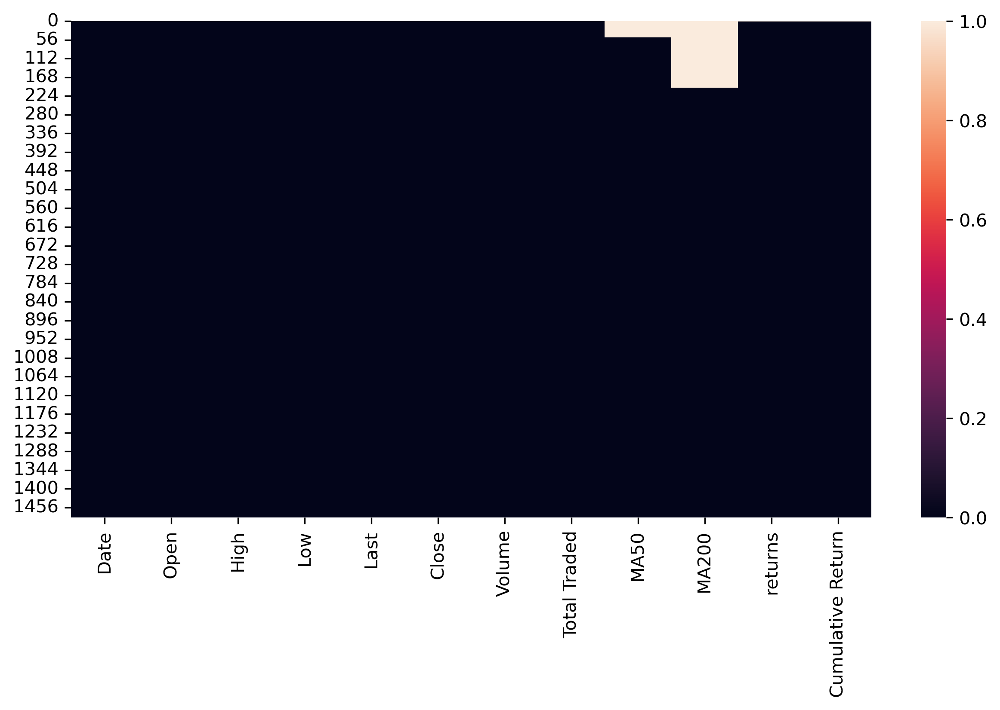

In [10]:
sns.heatmap(data.isna())

In [11]:
# to treat values we will check first outliers present in those columns 
# if present we will replace missing values with median of that column 
# if not, we will replace missing values with mean of that column

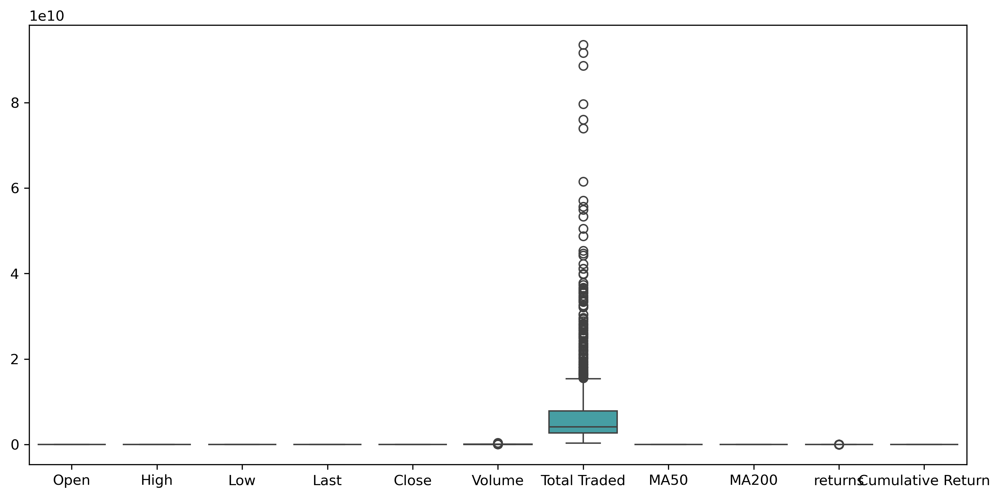

In [12]:
sns.boxplot(data)
plt.tight_layout()

In [13]:
# in MA50 and MA200 there are no outliers present, so we will replace missing values with mean of those columns respectively.

In [14]:
# for column MA50 
data['MA50'].fillna(data['MA50'].mean(),inplace=True)

In [15]:
data['MA200'].fillna(data['MA200'].mean(),inplace=True)

In [16]:
data.isna().sum()

Date                 0
Open                 0
High                 0
Low                  0
Last                 0
Close                0
Volume               0
Total Traded         0
MA50                 0
MA200                0
returns              1
Cumulative Return    1
dtype: int64

In [17]:
# for columns returns, Cumulative Return as there are only one missing value present in each we will drop that rows 
data[data['returns'].isna()]

,Date,Open,High,Low,Last,Close,Volume,Total Traded,MA50,MA200,returns,Cumulative Return
0,2016-01-01,392.5,403.0,373.0,401.8,401.9,4377363,1.718115e+09,298.444207,288.023096,NaN,NaN


In [18]:
data[data['Cumulative Return'].isna()]

,Date,Open,High,Low,Last,Close,Volume,Total Traded,MA50,MA200,returns,Cumulative Return
0,2016-01-01,392.5,403.0,373.0,401.8,401.9,4377363,1.718115e+09,298.444207,288.023096,NaN,NaN


In [19]:
# dropping 0th row 
data.drop(0,inplace=True)

In [20]:
data

,Date,Open,High,Low,Last,Close,Volume,Total Traded,MA50,MA200,returns,Cumulative Return
1,2016-01-04,400.00,400.10,375.05,376.15,377.05,7822660,3.129064e+09,298.444207,288.023096,-0.061831,0.938169
2,2016-01-05,381.05,382.45,372.10,373.00,374.45,6901068,2.629652e+09,298.444207,288.023096,-0.006896,0.931699
3,2016-01-06,374.25,375.50,364.60,365.00,365.90,7211230,2.698803e+09,298.444207,288.023096,-0.022833,0.910425
4,2016-01-07,356.25,358.00,338.10,344.80,343.55,11782307,4.197447e+09,298.444207,288.023096,-0.061082,0.854815
5,2016-01-08,345.60,355.85,345.60,353.90,353.35,8770370,3.031040e+09,298.444207,288.023096,0.028526,0.879199
...,...,...,...,...,...,...,...,...,...,...,...,...
1481,2021-12-27,465.70,472.45,460.10,472.45,471.15,12557565,5.848058e+09,488.014000,358.624250,0.007592,1.172307
1482,2021-12-28,475.20,482.80,472.65,480.35,480.20,22860916,1.086351e+10,487.666000,359.399500,0.019208,1.194825
1483,2021-12-29,478.75,481.60,474.25,474.75,476.00,10263884,4.913834e+09,486.994000,360.173250,-0.008746,1.184374
1484,2021-12-30,472.55,476.40,468.60,472.10,470.40,11923961,5.634668e+09,486.764000,360.949250,-0.011765,1.170440


In [21]:
data.reset_index(inplace=True)

In [22]:
data.drop(columns=['index'],inplace=True)

In [23]:
data.head()

,Date,Open,High,Low,Last,Close,Volume,Total Traded,MA50,MA200,returns,Cumulative Return
0,2016-01-04,400.00,400.10,375.05,376.15,377.05,7822660,3.129064e+09,298.444207,288.023096,-0.061831,0.938169
1,2016-01-05,381.05,382.45,372.10,373.00,374.45,6901068,2.629652e+09,298.444207,288.023096,-0.006896,0.931699
2,2016-01-06,374.25,375.50,364.60,365.00,365.90,7211230,2.698803e+09,298.444207,288.023096,-0.022833,0.910425
3,2016-01-07,356.25,358.00,338.10,344.80,343.55,11782307,4.197447e+09,298.444207,288.023096,-0.061082,0.854815
4,2016-01-08,345.60,355.85,345.60,353.90,353.35,8770370,3.031040e+09,298.444207,288.023096,0.028526,0.879199


In [24]:
data.isna().sum()

Date                 0
Open                 0
High                 0
Low                  0
Last                 0
Close                0
Volume               0
Total Traded         0
MA50                 0
MA200                0
returns              0
Cumulative Return    0
dtype: int64

### Treating Outliers

In [25]:
data.describe()

,Open,High,Low,Last,Close,Volume,Total Traded,MA50,MA200,returns,Cumulative Return
count,1485.000000,1485.000000,1485.000000,1485.000000,1485.000000,1.485000e+03,1.485000e+03,1485.000000,1485.000000,1485.000000,1485.000000
mean,302.795657,307.252660,297.662626,302.078923,302.088519,3.051025e+07,7.023934e+09,298.444207,288.023096,0.000560,0.751651
std,138.161439,139.328622,136.667968,137.858575,137.882687,3.627733e+07,8.803505e+09,133.292370,121.850386,0.029683,0.343077
min,66.500000,66.900000,63.500000,65.450000,65.300000,6.229990e+05,3.341767e+08,78.027000,115.888750,-0.175827,0.162478
25%,173.500000,176.800000,170.350000,173.500000,173.500000,7.629905e+06,2.661612e+09,175.035000,168.988750,-0.013637,0.431699
50%,307.850000,312.500000,303.050000,307.650000,307.700000,1.600190e+07,4.150282e+09,304.925000,288.023096,0.000375,0.765613
75%,429.100000,434.350000,424.000000,428.000000,428.400000,4.094314e+07,7.823731e+09,419.670000,401.551250,0.013737,1.065937
max,590.750000,598.400000,584.000000,589.250000,588.700000,3.905778e+08,9.352275e+10,545.218000,498.706500,0.204467,1.464792


<Axes: >

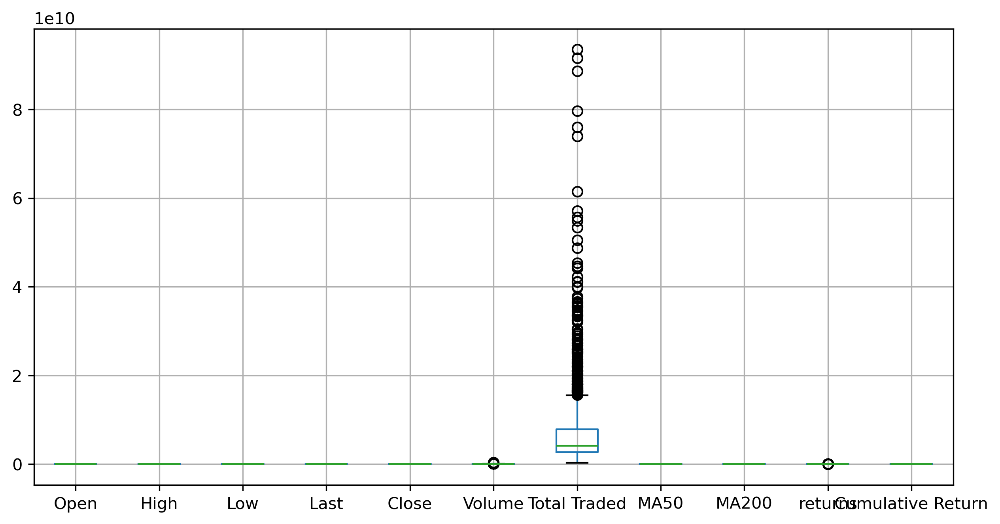

In [26]:
data.boxplot()

In [27]:
# from this we found that outliers are present in Columns Volume, Total Traded and returns
def outlier_detection(data,colname):
    q1 = data[colname].quantile(0.25)
    q3 = data[colname].quantile(0.75)
    iqr = q3-q1
    
    lower_extreme = q1 - (1.5 * iqr)
    upper_extreme = q3 + (1.5 * iqr)
    return lower_extreme, upper_extreme

In [28]:
def outlier_treatment(data,colname):
    lower_extreme, upper_extreme = outlier_detection(data,colname)
    data.loc[data[colname]>upper_extreme,colname] = upper_extreme
    data.loc[data[colname]<lower_extreme,colname] = lower_extreme
    
    print(f"All of outliers of column {colname} are treated !!!")

In [29]:
outlier_treatment(data,'Volume')
outlier_treatment(data,'Total Traded')
outlier_treatment(data,'returns')

All of outliers of column Volume are treated !!!
All of outliers of column Total Traded are treated !!!
All of outliers of column returns are treated !!!


<Axes: >

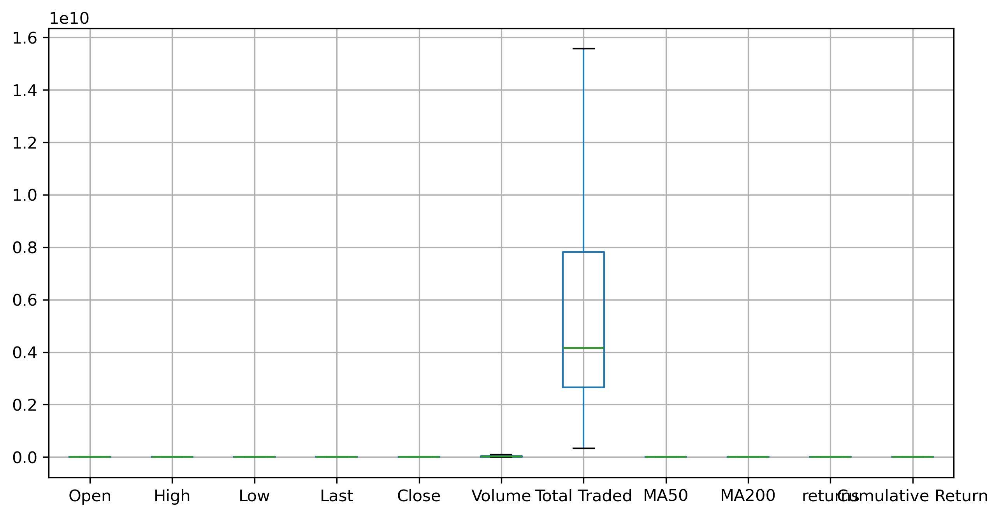

In [30]:
data.boxplot()

In [31]:
data.describe()

,Open,High,Low,Last,Close,Volume,Total Traded,MA50,MA200,returns,Cumulative Return
count,1485.000000,1485.000000,1485.000000,1485.000000,1485.000000,1.485000e+03,1.485000e+03,1485.000000,1485.000000,1485.000000,1485.000000
mean,302.795657,307.252660,297.662626,302.078923,302.088519,2.776637e+07,5.842610e+09,298.444207,288.023096,0.000128,0.751651
std,138.161439,139.328622,136.667968,137.858575,137.882687,2.606391e+07,4.264424e+09,133.292370,121.850386,0.023977,0.343077
min,66.500000,66.900000,63.500000,65.450000,65.300000,6.229990e+05,3.341767e+08,78.027000,115.888750,-0.054698,0.162478
25%,173.500000,176.800000,170.350000,173.500000,173.500000,7.629905e+06,2.661612e+09,175.035000,168.988750,-0.013637,0.431699
50%,307.850000,312.500000,303.050000,307.650000,307.700000,1.600190e+07,4.150282e+09,304.925000,288.023096,0.000375,0.765613
75%,429.100000,434.350000,424.000000,428.000000,428.400000,4.094314e+07,7.823731e+09,419.670000,401.551250,0.013737,1.065937
max,590.750000,598.400000,584.000000,589.250000,588.700000,9.091300e+07,1.556691e+10,545.218000,498.706500,0.054798,1.464792


### Scatter Plot And Correlation

In [32]:
sns.pairplot(data)

<Figure size 3000x1800 with 0 Axes>

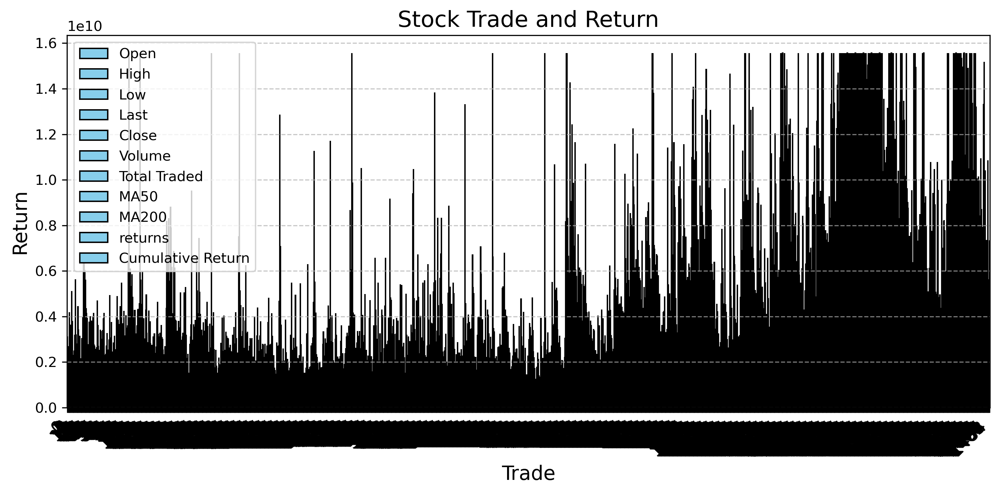

In [33]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
data.plot(kind='bar', color='skyblue', edgecolor='black')

plt.title('Stock Trade and Return', fontsize=16)
plt.xlabel('Trade', fontsize=14)
plt.ylabel('Return', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

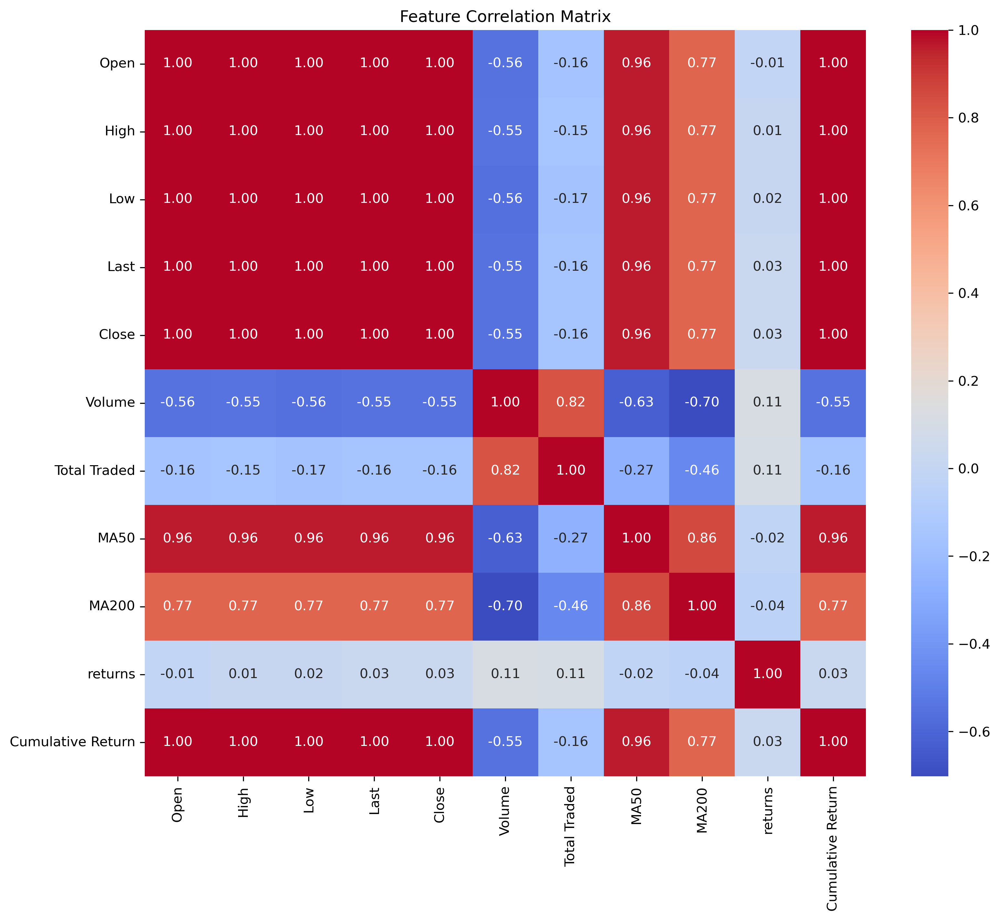

In [34]:
correlation_matrix = data.corr(numeric_only=True)
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Matrix')
plt.show()

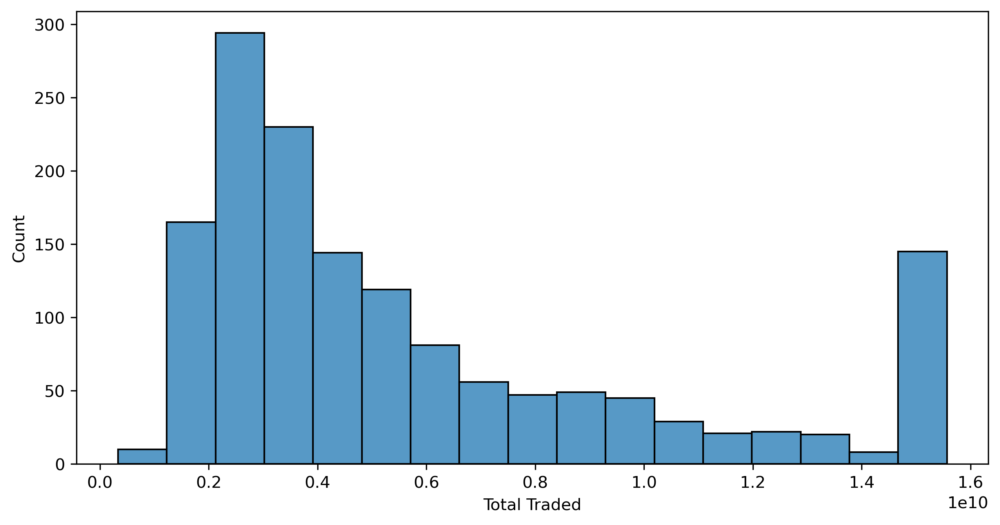

In [35]:
sns.histplot(data['Total Traded'])
plt.show()

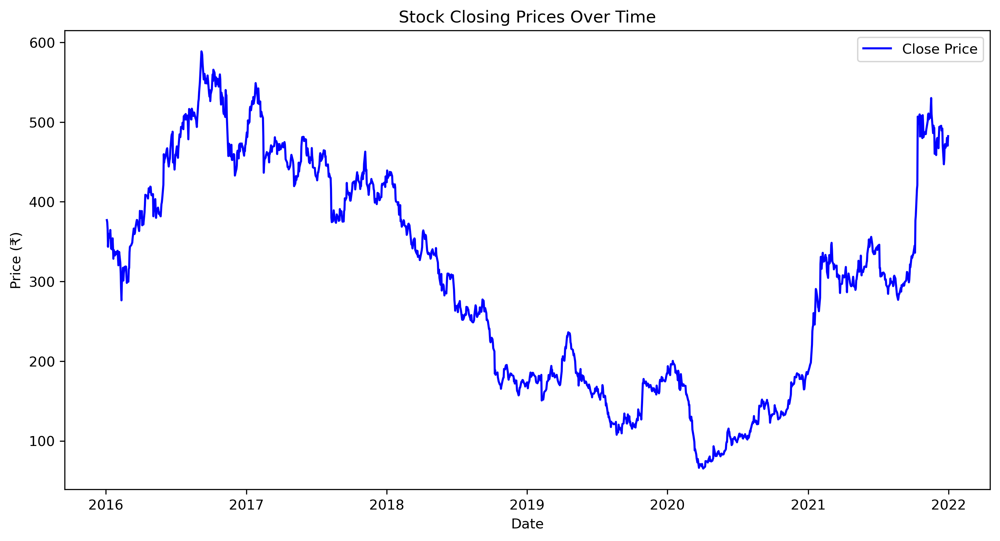

In [36]:
data['Date'] = pd.to_datetime(data['Date'])
plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['Close'], label='Close Price', color='blue')
plt.title('Stock Closing Prices Over Time')
plt.xlabel('Date')
plt.ylabel('Price (₹)')
plt.legend()
plt.show()

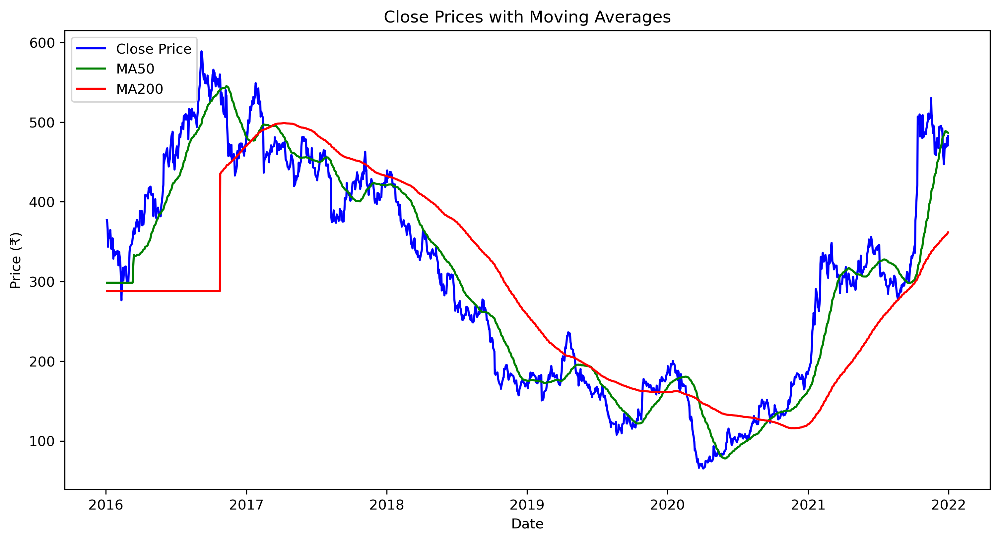

In [37]:
plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['Close'], label='Close Price', color='blue')
plt.plot(data['Date'], data['MA50'], label='MA50', color='green')
plt.plot(data['Date'], data['MA200'], label='MA200', color='red')
plt.title('Close Prices with Moving Averages')
plt.xlabel('Date')
plt.ylabel('Price (₹)')
plt.legend()
plt.show()

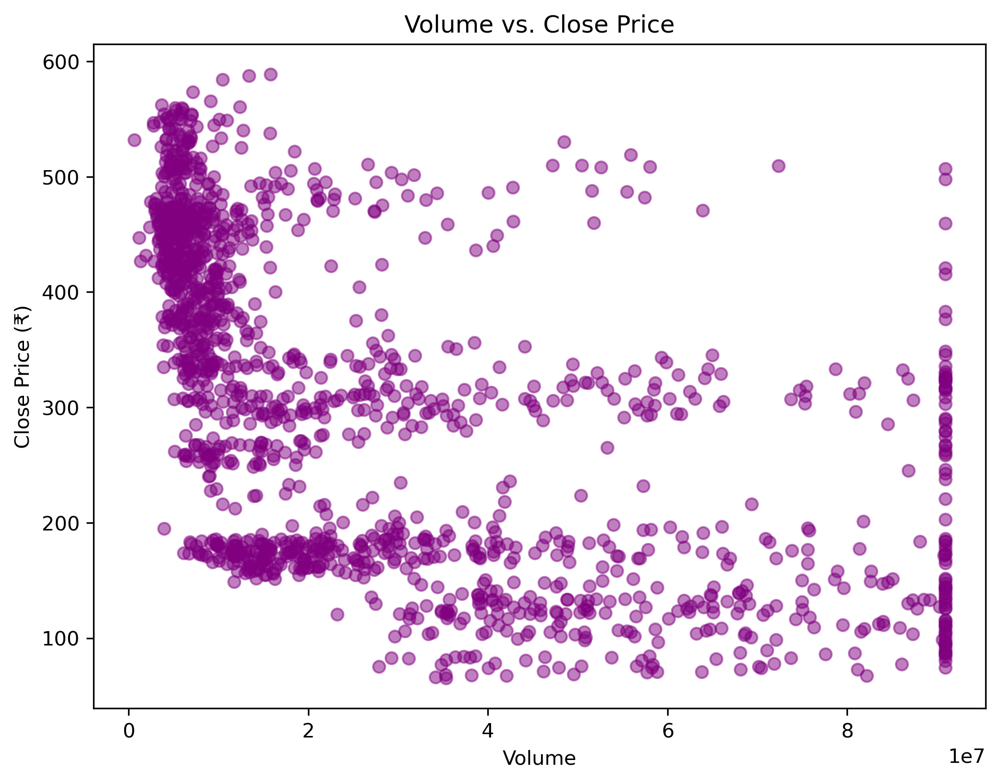

In [38]:
plt.figure(figsize=(8, 6))
plt.scatter(data['Volume'], data['Close'], alpha=0.5, color='purple')
plt.title('Volume vs. Close Price')
plt.xlabel('Volume')
plt.ylabel('Close Price (₹)')
plt.show()

In [39]:
data

,Date,Open,High,Low,Last,Close,Volume,Total Traded,MA50,MA200,returns,Cumulative Return
0,2016-01-04,400.00,400.10,375.05,376.15,377.05,7822660,3.129064e+09,298.444207,288.023096,-0.054698,0.938169
1,2016-01-05,381.05,382.45,372.10,373.00,374.45,6901068,2.629652e+09,298.444207,288.023096,-0.006896,0.931699
2,2016-01-06,374.25,375.50,364.60,365.00,365.90,7211230,2.698803e+09,298.444207,288.023096,-0.022833,0.910425
3,2016-01-07,356.25,358.00,338.10,344.80,343.55,11782307,4.197447e+09,298.444207,288.023096,-0.054698,0.854815
4,2016-01-08,345.60,355.85,345.60,353.90,353.35,8770370,3.031040e+09,298.444207,288.023096,0.028526,0.879199
...,...,...,...,...,...,...,...,...,...,...,...,...
1480,2021-12-27,465.70,472.45,460.10,472.45,471.15,12557565,5.848058e+09,488.014000,358.624250,0.007592,1.172307
1481,2021-12-28,475.20,482.80,472.65,480.35,480.20,22860916,1.086351e+10,487.666000,359.399500,0.019208,1.194825
1482,2021-12-29,478.75,481.60,474.25,474.75,476.00,10263884,4.913834e+09,486.994000,360.173250,-0.008746,1.184374
1483,2021-12-30,472.55,476.40,468.60,472.10,470.40,11923961,5.634668e+09,486.764000,360.949250,-0.011765,1.170440


In [40]:
data.set_index('Date', inplace=True)
data.head()

,Open,High,Low,Last,Close,Volume,Total Traded,MA50,MA200,returns,Cumulative Return
Date,,,,,,,,,,,
2016-01-04,400.00,400.10,375.05,376.15,377.05,7822660,3.129064e+09,298.444207,288.023096,-0.054698,0.938169
2016-01-05,381.05,382.45,372.10,373.00,374.45,6901068,2.629652e+09,298.444207,288.023096,-0.006896,0.931699
2016-01-06,374.25,375.50,364.60,365.00,365.90,7211230,2.698803e+09,298.444207,288.023096,-0.022833,0.910425
2016-01-07,356.25,358.00,338.10,344.80,343.55,11782307,4.197447e+09,298.444207,288.023096,-0.054698,0.854815
2016-01-08,345.60,355.85,345.60,353.90,353.35,8770370,3.031040e+09,298.444207,288.023096,0.028526,0.879199


In [41]:
from statsmodels.tsa.stattools import adfuller

# Perform Augmented Dickey-Fuller test
result = adfuller(data['returns'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])

# Conclusion based on p-value
if result[1] < 0.05:
    print("Data is stationary")
else:
    print("Data is non-stationary")


ADF Statistic: -37.579727605680795
p-value: 0.0
Data is stationary


In [42]:
# Split the data into training and testing sets (80% training, 20% testing)
train_size = int(len(data) * 0.8)
train, test = data[:train_size], data[train_size:]

# Extract target variable 
train_target = train['returns']
test_target = test['returns']


In [43]:
#!pip install pmdarima
import warnings
warnings.filterwarnings('ignore')


In [44]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from pmdarima import auto_arima
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from keras.models import Sequential
from keras.layers import LSTM, Dense



<h3>arima model- model 1</h3>

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[5] intercept   : AIC=-5492.701, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[5] intercept   : AIC=-5503.778, Time=0.09 sec
 ARIMA(1,0,0)(1,0,0)[5] intercept   : AIC=-5500.525, Time=0.58 sec
 ARIMA(0,0,1)(0,0,1)[5] intercept   : AIC=-5500.519, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[5]             : AIC=-5504.702, Time=0.05 sec
 ARIMA(0,0,0)(1,0,0)[5] intercept   : AIC=-5502.108, Time=0.16 sec
 ARIMA(0,0,0)(0,0,1)[5] intercept   : AIC=-5502.056, Time=0.11 sec
 ARIMA(0,0,0)(1,0,1)[5] intercept   : AIC=-5500.255, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[5] intercept   : AIC=-5502.196, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[5] intercept   : AIC=-5502.183, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[5] intercept   : AIC=-5500.190, Time=0.33 sec

Best model:  ARIMA(0,0,0)(0,0,0)[5]          
Total fit time: 2.699 seconds


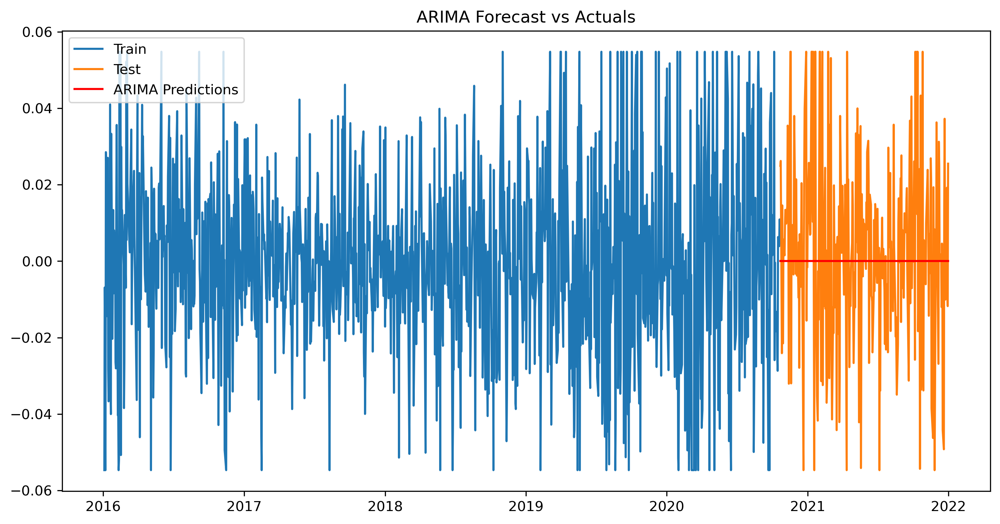

ARIMA RMSE: 0.024496812409966904


In [45]:
# Fit the ARIMA model
from pmdarima import auto_arima

# ARIMA model with automatic parameter selection
arima_model = auto_arima(train_target, seasonal=True, m=5, trace=True, suppress_warnings=True)

# Forecast the next 200 days
arima_forecast = arima_model.predict(n_periods=len(test))

# Plot the actual vs. predicted values
plt.figure(figsize=(12, 6))
plt.plot(train_target, label='Train')
plt.plot(test_target, label='Test')
plt.plot(test_target.index, arima_forecast, label='ARIMA Predictions', color='red')
plt.legend()
plt.title("ARIMA Forecast vs Actuals")
plt.show()

# Evaluate ARIMA Model
arima_rmse = np.sqrt(mean_squared_error(test_target, arima_forecast))
print(f"ARIMA RMSE: {arima_rmse}")


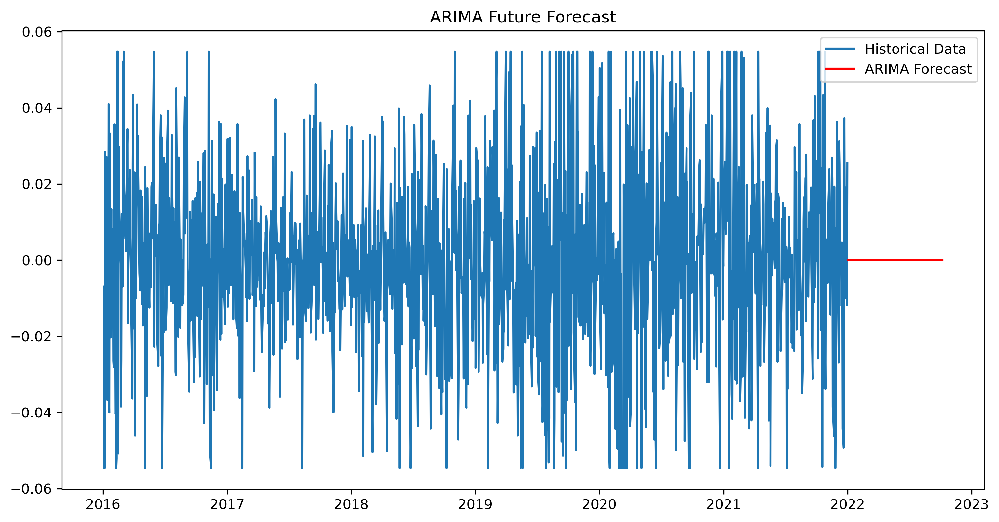

In [46]:
# Forecast the next 200 days using ARIMA
arima_future = arima_model.predict(n_periods=200)
arima_future_dates = pd.date_range(start=data.index[-1] + pd.Timedelta(days=1), periods=200, freq='B')

# Plot the forecasted values
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['returns'], label='Historical Data')
plt.plot(arima_future_dates, arima_future, label='ARIMA Forecast', color='red')
plt.legend()
plt.title("ARIMA Future Forecast")
plt.show()


<h3>LSTM - MODEL 2</h3>

Epoch 1/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1043
Epoch 2/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0469
Epoch 3/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0461
Epoch 4/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0476
Epoch 5/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0456
Epoch 6/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0461
Epoch 7/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0452
Epoch 8/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0447
Epoch 9/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0491
Epoch 10/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0466
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


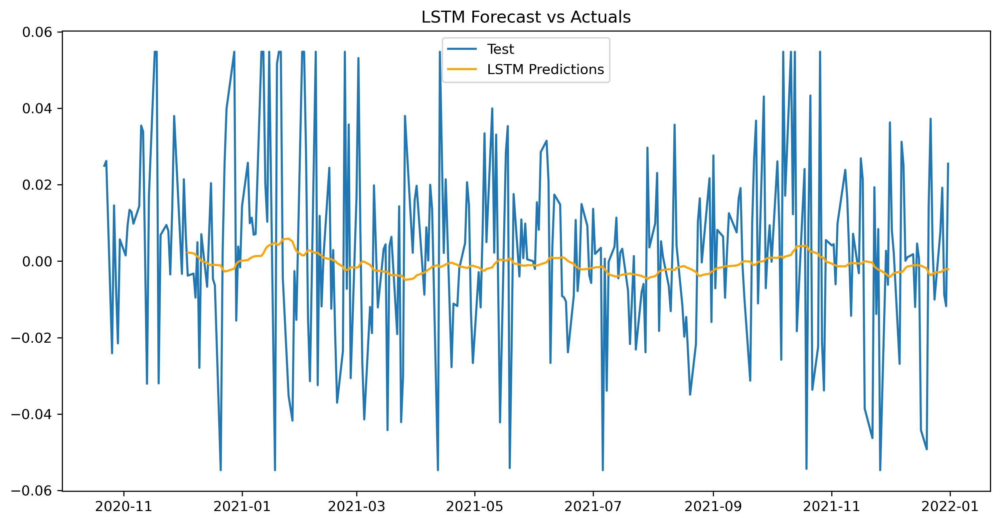

LSTM RMSE: 0.024774906582158366


In [47]:
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Reshaping data for LSTM
train_data = train_target.values.reshape(-1, 1)
test_data = test_target.values.reshape(-1, 1)

# Normalize the data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))

train_data_scaled = scaler.fit_transform(train_data)
test_data_scaled = scaler.transform(test_data)

# Prepare the data for LSTM (create sequences)
def create_sequences(data, time_step=1):
    X, y = [], []
    for i in range(len(data) - time_step):
        X.append(data[i:i + time_step])
        y.append(data[i + time_step])
    return np.array(X), np.array(y)

time_step = 30  # Look-back period
X_train, y_train = create_sequences(train_data_scaled, time_step)
X_test, y_test = create_sequences(test_data_scaled, time_step)

# Build the LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(time_step, 1)))
model.add(LSTM(units=50))
model.add(Dense(units=1))
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the LSTM model
model.fit(X_train, y_train, epochs=10, batch_size=32)

# Make predictions
lstm_predictions = model.predict(X_test)

# Inverse the scaling
lstm_predictions_rescaled = scaler.inverse_transform(lstm_predictions)

# Plot the actual vs. predicted values for LSTM
plt.figure(figsize=(12, 6))
plt.plot(test_target, label='Test')
plt.plot(test_target.index[time_step:], lstm_predictions_rescaled, label='LSTM Predictions', color='orange')
plt.legend()
plt.title("LSTM Forecast vs Actuals")
plt.show()

# Evaluate LSTM Model
lstm_rmse = np.sqrt(mean_squared_error(test_target[time_step:], lstm_predictions_rescaled))
print(f"LSTM RMSE: {lstm_rmse}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


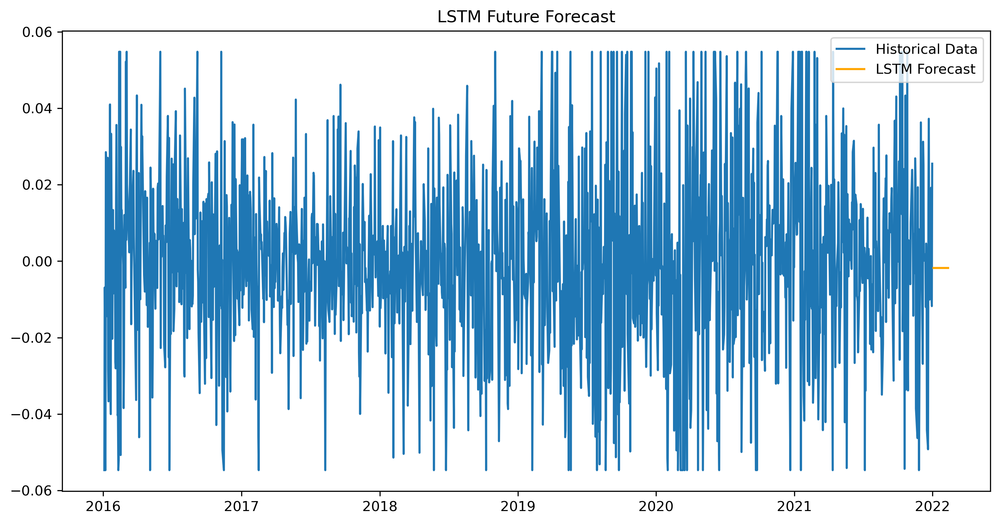

In [48]:
# Use the last 'time_step' values to predict the future 30 days with LSTM
last_data = data['returns'].values[-time_step:].reshape(-1, 1)
last_data_scaled = scaler.transform(last_data)

X_last = []
for i in range(1, 31):  # Forecast the next 30 days
    X_last.append(last_data_scaled)
    last_data = np.append(last_data, lstm_predictions[-1])
    
X_last = np.array(X_last)

lstm_future = model.predict(X_last)
lstm_future_rescaled = scaler.inverse_transform(lstm_future)

lstm_future_dates = pd.date_range(start=data.index[-1] + pd.Timedelta(days=1), periods=30, freq='B')

# Plot the forecasted values
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['returns'], label='Historical Data')
plt.plot(lstm_future_dates, lstm_future_rescaled, label='LSTM Forecast', color='orange')
plt.legend()
plt.title("LSTM Future Forecast")
plt.show()


<h3>Simple Exponential Smoothing - model 3</h3>

In [49]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing

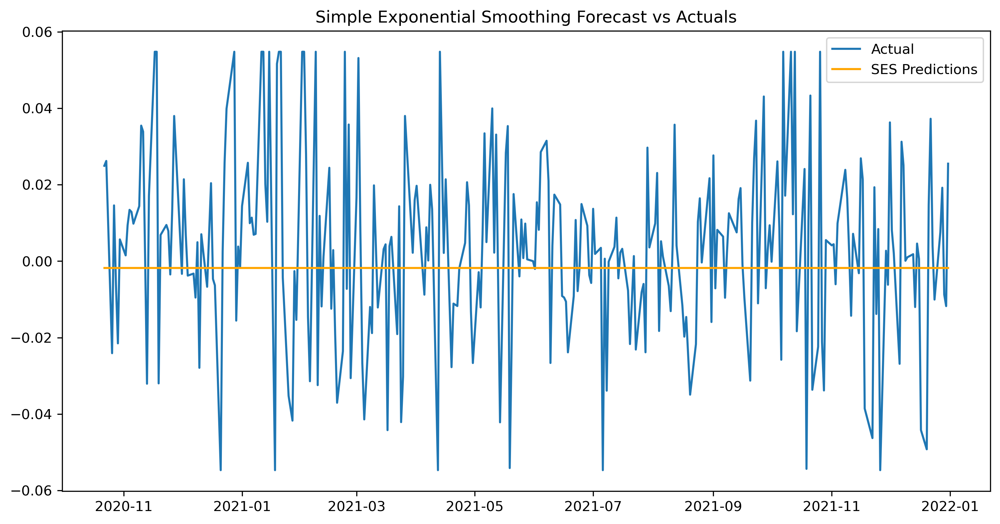

In [50]:
# Simple Exponential Smoothing Model
ses_model = SimpleExpSmoothing(train_target)

# Fit the model with smoothing level alpha (0 <= alpha <= 1), choose alpha = 0.2 (or any suitable value)
ses_fit = ses_model.fit(smoothing_level=0.2, optimized=False)

# Make predictions for the test data
ses_predictions = ses_fit.forecast(len(test_target))

# Plot the actual vs predicted values
plt.figure(figsize=(12, 6))
plt.plot(test_target, label='Actual')
plt.plot(test_target.index, ses_predictions, label='SES Predictions', color='orange')
plt.legend()
plt.title("Simple Exponential Smoothing Forecast vs Actuals")
plt.show()


In [51]:
# Evaluate the model using RMSE
ses_rmse = np.sqrt(mean_squared_error(test_target, ses_predictions))
print(f"Simple Exponential Smoothing RMSE: {ses_rmse}")


Simple Exponential Smoothing RMSE: 0.024810055754932506


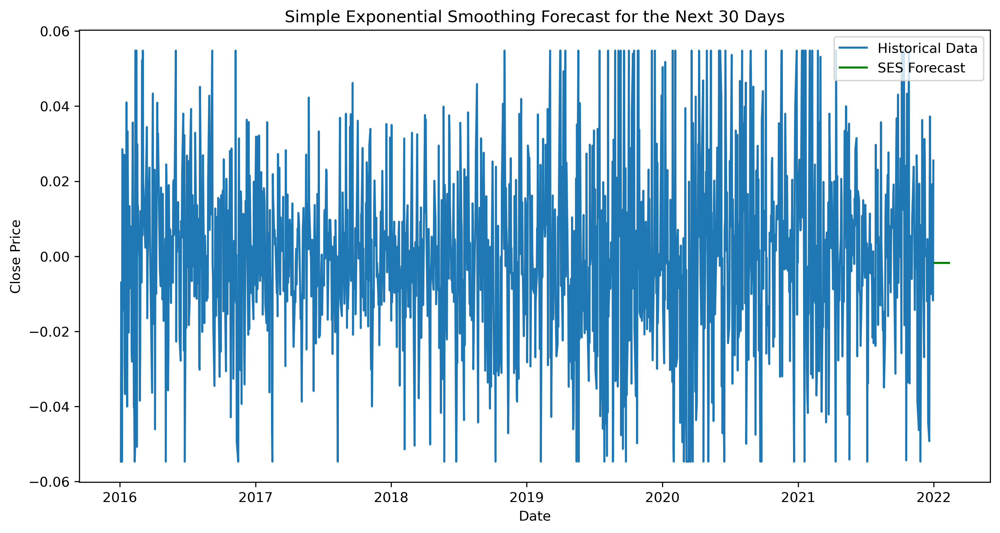

In [52]:
forecast_period = 30  # Forecast for the next 30 days

# Make forecast for the next 30 days using SES model
ses_forecast = ses_fit.forecast(forecast_period)

# Generate future dates for the forecast
forecast_dates = pd.date_range(
    start=data.index[-1] + pd.Timedelta(days=1),  # Start from the day after the last data point
    periods=forecast_period,  # Number of periods to forecast
    freq='B'  # Business days, can adjust if needed
)

# Plot the forecasted values along with the historical data
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['returns'], label='Historical Data')  # Plot historical data
plt.plot(forecast_dates, ses_forecast, label='SES Forecast', color='green')  # Plot forecasted values
plt.legend()
plt.title("Simple Exponential Smoothing Forecast for the Next 30 Days")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.show()

<h3>Holt-Winters Exponential Smoothing Additive Model - model 4</h3>

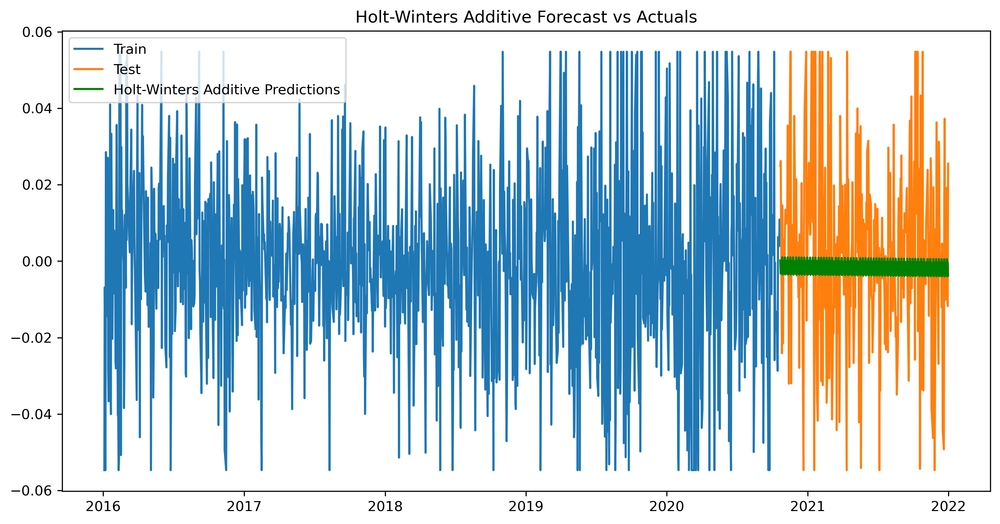

Holt-Winters Additive RMSE: 0.02489219479079295


In [53]:
# Holt-Winters Exponential Smoothing Additive Model
holt_additive_model = ExponentialSmoothing(train_target, trend='add', seasonal='add', seasonal_periods=5).fit()

# Forecast the next 30 days
holt_additive_forecast = holt_additive_model.forecast(len(test))

# Plot the actual vs. predicted values
plt.figure(figsize=(12, 6))
plt.plot(train_target, label='Train')
plt.plot(test_target, label='Test')
plt.plot(test_target.index, holt_additive_forecast, label='Holt-Winters Additive Predictions', color='green')
plt.legend()
plt.title("Holt-Winters Additive Forecast vs Actuals")
plt.show()

# Evaluate Holt-Winters Additive Model
holt_additive_rmse = np.sqrt(mean_squared_error(test_target, holt_additive_forecast))
print(f"Holt-Winters Additive RMSE: {holt_additive_rmse}")


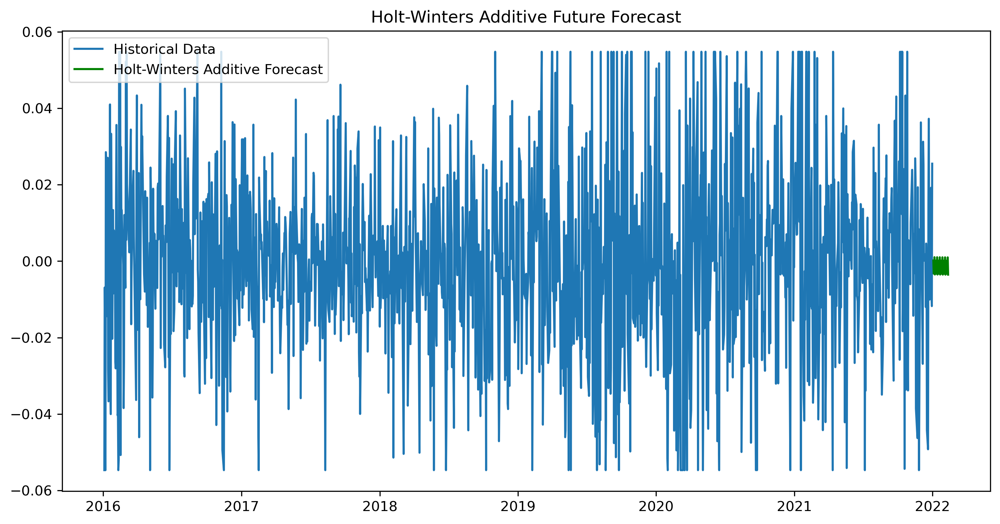

In [54]:
# Forecast the next 30 days using Holt-Winters Additive
holt_additive_future = holt_additive_model.forecast(30)
holt_additive_future_dates = pd.date_range(start=data.index[-1] + pd.Timedelta(days=1), periods=30, freq='B')

# Plot the forecasted values
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['returns'], label='Historical Data')
plt.plot(holt_additive_future_dates, holt_additive_future, label='Holt-Winters Additive Forecast', color='green')
plt.legend()
plt.title("Holt-Winters Additive Future Forecast")
plt.show()


In [55]:
print(f"ARIMA MSE: {arima_rmse}")
print(f"Holt-Winters Additive MSE: {holt_additive_rmse}")
print(f" Simple Exponential Smoothing Model MSE: {ses_rmse}")
print(f"LSTM MSE: {lstm_rmse}")

ARIMA MSE: 0.024496812409966904
Holt-Winters Additive MSE: 0.02489219479079295
 Simple Exponential Smoothing Model MSE: 0.024810055754932506
LSTM MSE: 0.024774906582158366


In [60]:
'''we have low rmse for arima model in forecasting  but we see a flat line in forecasting future values ,so we choose Holt-Winters Exponential Smoothing Additive Model '''

'we have low rmse for arima model in forecasting we see a flat line ,so we choose Holt-Winters Exponential Smoothing Additive Model '

In [57]:
'''Forecasting graphs give you insights into whether the model is following the actual trend and capturing patterns (like seasonality or sudden spikes) that MSE may not fully capture.'''

'Forecasting graphs give you insights into whether the model is following the actual trend and capturing patterns (like seasonality or sudden spikes) that MSE may not fully capture.'